In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf

import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io

from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.utils import load_img, img_to_array

In [3]:
# Get bounding box values from training data xml file

path = glob('/content/drive/MyDrive/Project Data/annotations/*.xml')
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])
for filename in path:

    info = xet.parse(filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

    labels_dict['filepath'].append(filename)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

convert the dictionary to dataframe

In [4]:
df = pd.DataFrame(labels_dict)
#df.to_csv('/content/drive/MyDrive/Project Data/labels.csv',index=False)
df.head()

,filepath,xmin,xmax,ymin,ymax
0,/content/drive/MyDrive/Project Data/annotation...,360,383,166,181
1,/content/drive/MyDrive/Project Data/annotation...,103,293,99,201
2,/content/drive/MyDrive/Project Data/annotation...,247,375,185,223
3,/content/drive/MyDrive/Project Data/annotation...,19,497,29,245
4,/content/drive/MyDrive/Project Data/annotation...,280,355,196,257


In [5]:
df[:1]

,filepath,xmin,xmax,ymin,ymax
0,/content/drive/MyDrive/Project Data/annotation...,360,383,166,181


add image path in dataframe

In [6]:
df["imagepath"] = df["filepath"]

In [7]:
df["imagepath"] = df["imagepath"].map(lambda x: x.split("/"))\
                                  .map(lambda x:x[6])\
                                  .map(lambda x: x.split("."))\
                                  .map(lambda x:"Cars"+x[0][4:]+".png" if x[0][:4]=="Cars" else x[0]+".jpeg")\
                                  .map(lambda x: "/content/drive/MyDrive/Project Data/images/"+x)

In [8]:
df[:2]

,filepath,xmin,xmax,ymin,ymax,imagepath
0,/content/drive/MyDrive/Project Data/annotation...,360,383,166,181,/content/drive/MyDrive/Project Data/images/Car...
1,/content/drive/MyDrive/Project Data/annotation...,103,293,99,201,/content/drive/MyDrive/Project Data/images/Car...


checking if the bounding box coordinates obtained are correct or not

In [9]:
df.iloc[87,]

filepath     /content/drive/MyDrive/Project Data/annotation...
xmin                                                       149
xmax                                                       245
ymin                                                       210
ymax                                                       235
imagepath    /content/drive/MyDrive/Project Data/images/Car...
Name: 87, dtype: object


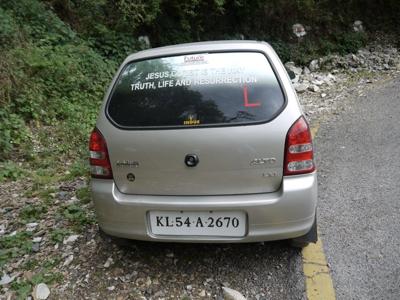

In [11]:
file_path = df['imagepath'][87] #path of our image
img = io.imread(file_path) #Read the image
fig = px.imshow(img)
fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure bounding box')
fig.add_shape(type='rect',x0=149, x1=245, y0=210, y1=235, xref='x', yref='y',line_color='cyan')

In [12]:
df['imagepath'][87] 

'/content/drive/MyDrive/Project Data/images/Cars190.png'

Data Preprocessing

reshape image to standard size and convert the image to list and
Normalize the data

In [13]:
labels = df.iloc[:,1:5].values
data = []
output = []
for ind in range(len(df['imagepath'])):
    image = df['imagepath'][ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape
    # Prepprocesing
    load_image = load_img(image,target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0 # Normalization
    # Normalization to labels
    xmin,xmax,ymin,ymax = labels[ind]
    nxmin,nxmax = xmin/w,xmax/w
    nymin,nymax = ymin/h,ymax/h
    label_norm = (nxmin,nxmax,nymin,nymax) # Normalized output
    # Append
    data.append(norm_load_image_arr)
    output.append(label_norm)

In [14]:
# Convert data to numpy.ndarray
X = np.array(data,dtype=np.float32)
y = np.array(output,dtype=np.float32)

In [15]:
type(data)

list

In [16]:
type(X)

numpy.ndarray

In [17]:
X.shape

(658, 224, 224, 3)

In [18]:
# Split the data into training and testing set using sklearn.
x_train,x_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((526, 224, 224, 3), (132, 224, 224, 3), (526, 4), (132, 4))

In [19]:
inception_resnet = InceptionResNetV2(weights="imagenet",include_top=False, input_tensor=Input(shape=(224,224,3)))
# ---------------------
headmodel = inception_resnet.output
headmodel = Flatten()(headmodel)
headmodel = Dense(500,activation="relu")(headmodel)
headmodel = Dense(250,activation="relu")(headmodel)
headmodel = Dense(4,activation='sigmoid')(headmodel)


# ---------- model
model = Model(inputs=inception_resnet.input,outputs=headmodel)

219055592/219055592 [==============================] - 6s 0us/step


In [20]:
#compile the model
model.compile(loss='mse',optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),metrics=["mae"])


In [21]:
# fitting the model
history = model.fit(x=x_train,y=y_train,batch_size=10,epochs=120,
                    validation_data=(x_test,y_test))

Epoch 1/120
53/53 [==============================] - 136s 395ms/step - loss: 0.0479 - mae: 0.1662 - val_loss: 0.0437 - val_mae: 0.1737
Epoch 2/120
53/53 [==============================] - 12s 227ms/step - loss: 0.0136 - mae: 0.0849 - val_loss: 0.0194 - val_mae: 0.1128
Epoch 3/120
53/53 [==============================] - 12s 235ms/step - loss: 0.0080 - mae: 0.0658 - val_loss: 0.0087 - val_mae: 0.0651
Epoch 4/120
53/53 [==============================] - 12s 235ms/step - loss: 0.0043 - mae: 0.0466 - val_loss: 0.0089 - val_mae: 0.0571
Epoch 5/120
53/53 [==============================] - 12s 230ms/step - loss: 0.0031 - mae: 0.0377 - val_loss: 0.0104 - val_mae: 0.0591
Epoch 6/120
53/53 [==============================] - 13s 237ms/step - loss: 0.0028 - mae: 0.0369 - val_loss: 0.0095 - val_mae: 0.0551
Epoch 7/120
53/53 [==============================] - 12s 231ms/step - loss: 0.0022 - mae: 0.0309 - val_loss: 0.0097 - val_mae: 0.0539
Epoch 8/120
53/53 [==============================] - 12s 232m

save the model

In [22]:
import pickle

In [23]:
pickle.dump(model,open('/content/drive/MyDrive/Project Data/model.pkl','wb'))

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers
......activation
.........vars
......activation_1
.........vars
......activation_10
.........vars
......activation_100
.........vars
......activation_101
.........vars
......activation_102
.........vars
......activation_103
.........vars
......activation_104
.........vars
......activation_105
.........vars
......activation_106
.........vars
......activation_107
.........vars
......activation_108
.........vars
......activation_109
.........vars
......activation_11
.........vars
......activation_110
.........vars
......activation_111
.........vars
......activation_112
.........vars
......activation_113
.........vars
......activation_114
.........vars
......activation_115
.........vars
......activation_116
.........vars
......activation_117
.........vars
......activation_118
.........vars
......activation_119
.........vars
......activation_12
.........vars
......activation_120
.........vars
......activation_121
..

here we will use saved model 

In [24]:
model = pickle.load(open('/content/drive/MyDrive/Project Data/model.pkl','rb'))

Keras model archive loading:
File Name                                             Modified             Size
variables.h5                                   2023-03-06 09:58:42    885708696
metadata.json                                  2023-03-06 09:58:32           64
config.json                                    2023-03-06 09:58:32       379653
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers
......activation
.........vars
......activation_1
.........vars
......activation_10
.........vars
......activation_100
.........vars
......activation_101
.........vars
......activation_102
.........vars
......activation_103
.........vars
......activation_104
.........vars
......activation_105
.........vars
......activation_106
.........vars
......activation_107
.........vars
......activation_108
.........vars
......activation_109
.........vars
......activation_11
.........vars
......activation_110
.........vars
......activation_111
.........vars
......activation_112
..

Get the test image and do preprocessing on it 

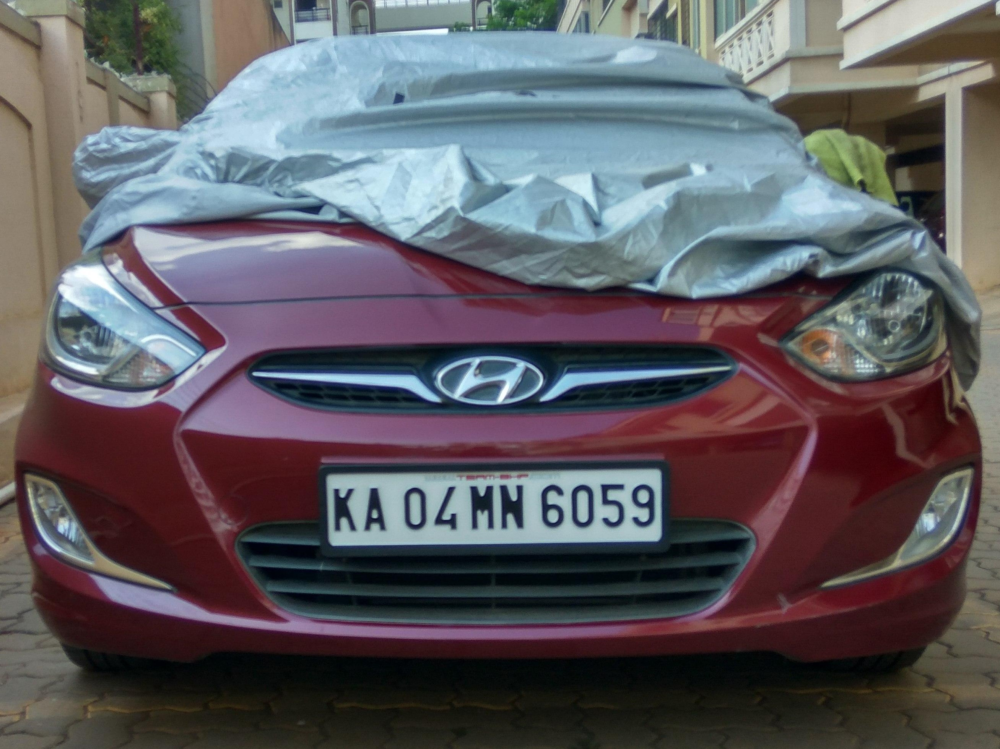

In [25]:
path = '/content/drive/MyDrive/Project Data/TEST/IMG_20170505_165100_HDR.jpeg'
test_image = load_img(path)
test_image

In [26]:
def test_object_detection(path):
  image = load_img(path) # PIL object
  image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
  h,w,d = image.shape
  image1 = load_img(path,target_size=(224,224))
  image_arr_224 = img_to_array(image1)/255.0  # Convert into array and get the normalized output
  test_arr = image_arr_224.reshape(1,224,224,3)

  # make prediction
  coords = model.predict(test_arr)

  # denormalize the output
  denorm = np.array([w,w,h,h])
  coords = coords * denorm
  coords = coords.astype(np.int32)

  # draw bounding box on top of image
  xmin,xmax,ymin,ymax = coords[0]
  pt1 = (xmin,ymin)
  pt2 = (xmax,ymax)
  print(pt1,pt2)
  cv2.rectangle(image,pt1,pt2,(0,255,0),3)
  return image,coords

image,li_coords = test_object_detection(path)
print(image.shape)

1/1 [==============================] - 6s 6s/step
(827, 1214) (1750, 1453)
(1961, 2615, 3)



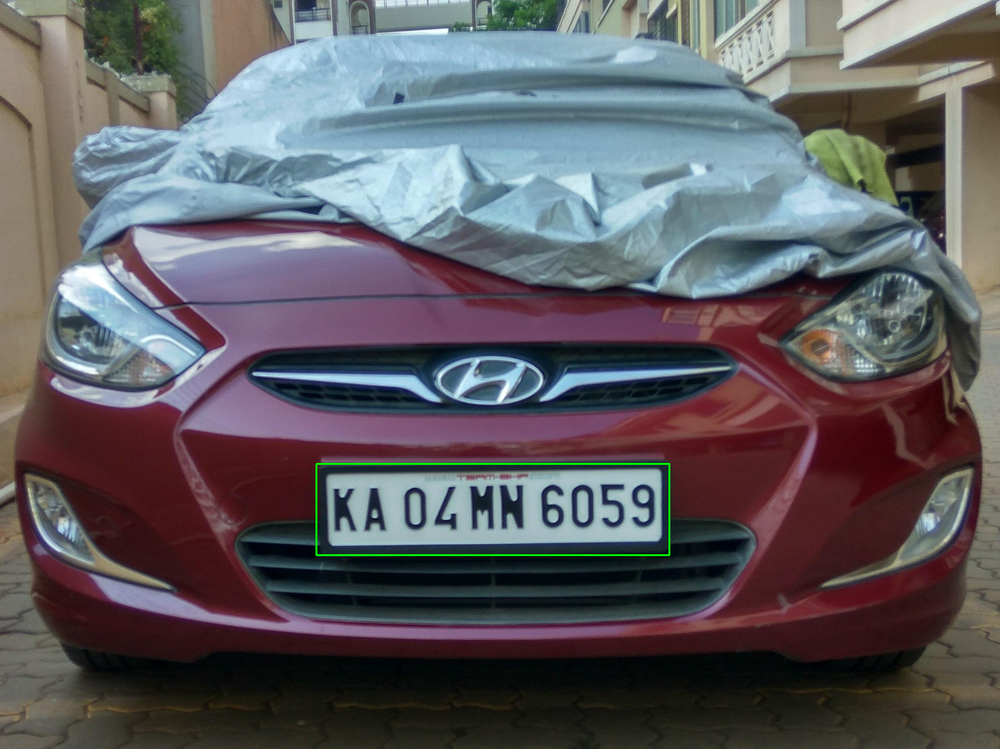

In [27]:
fig = px.imshow(image)  
#fig.update_layout(margin=dict(l=10, r=10, b=10, t=10),xaxis_title='image after license plate detection')
fig

6. OPTICAL CHARACTER RECOGNITION - OCR

In [28]:
li_coords[0]

array([ 827, 1750, 1214, 1453], dtype=int32)


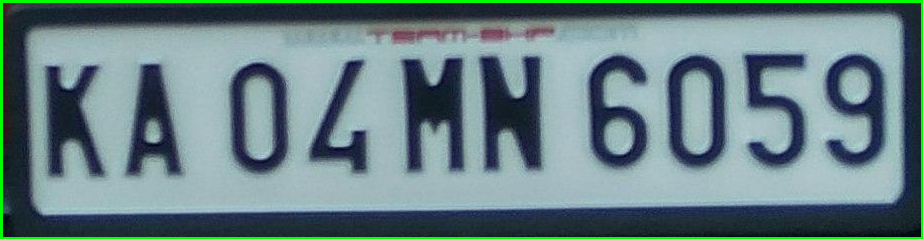

In [29]:
# find region of interest 
xmin,xmax,ymin,ymax = li_coords[0]
roi = image[ymin:ymax,xmin:xmax]
fig = px.imshow(roi)
fig.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Cropped image of license plate')


install tesseract

In [30]:
! apt install tesseract-ocr
! apt install libtesseract-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 22 not upgraded.
Need to get 4,850 kB of archives.
After this operation, 16.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1 [1,598 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 tesseract-ocr amd64 4.1.1-2build2 [262 kB]
Fetched 4,850 kB in 1s (4,756 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 128215 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-eng_1%3

In [31]:
!pip install pytesseract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [32]:
import pytesseract as pt

In [33]:
text = pt.image_to_string(roi)
print(text)

KA O4MN 6059



In [34]:
license_plate=''
for i in text:
  if i.isalnum():
    license_plate=license_plate + i 

print(license_plate)


KAO4MN6059
